In [43]:
from google.colab import files
uploaded = files.upload()
# get png file

Saving forest-1061965_1280.jpg to forest-1061965_1280.jpg


In [2]:
!ls 

sample_data


In [0]:
# !wget https://i0.wp.com/photos1.blogger.com/blogger/4342/1789/400/colbert-greenscreen-thumb.jpg

Using TensorFlow backend.


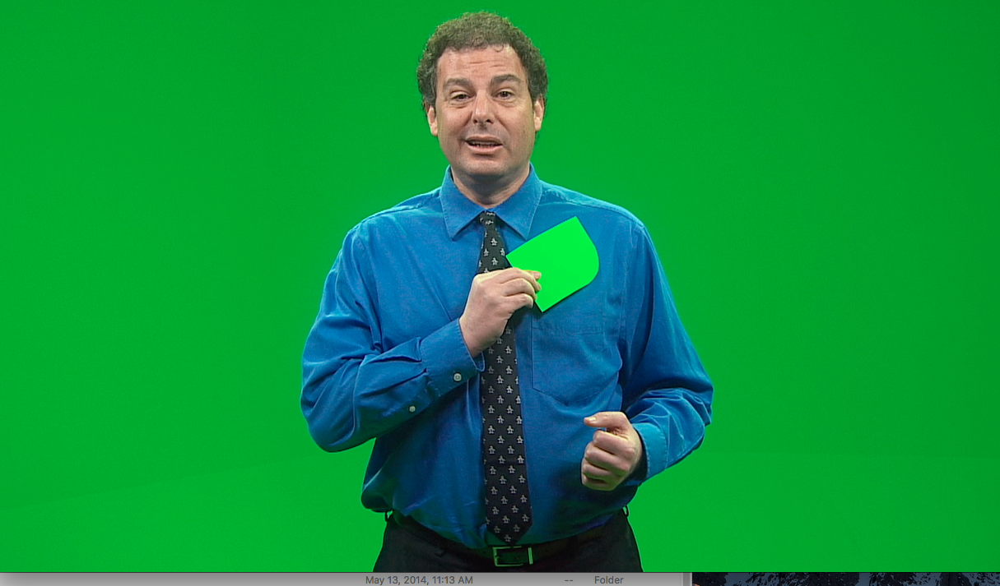

In [4]:
import numpy as np
from keras.preprocessing import image
# img = image.load_img("colbert-greenscreen-thumb.jpg")
# img = image.load_img("hello.gv.png")
img = image.load_img("Screen Shot 2020-03-30 at 11.58.20 AM.png")

display(img)

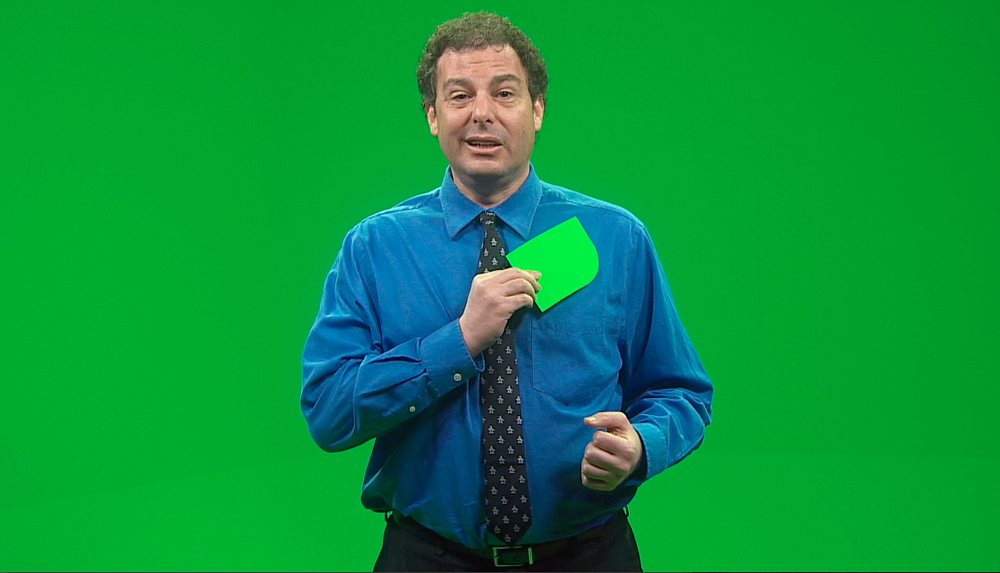

In [5]:
arr = image.img_to_array(img)
# Trim off edges
arr = arr[:697,:]
display(image.array_to_img(arr,scale=False))

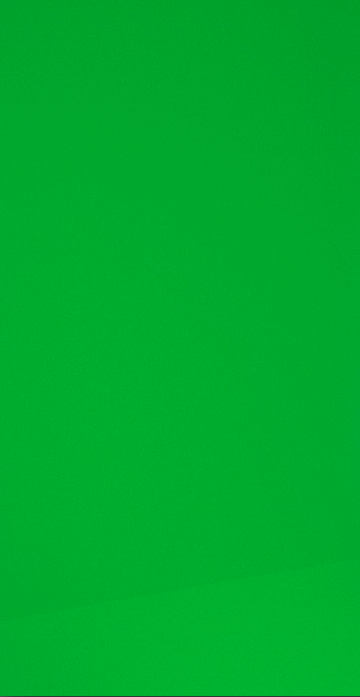

In [6]:
# background
tmp = arr[:,:360]
display(image.array_to_img(tmp,scale=False))

yesList = np.reshape(tmp,(-1,3))

In [16]:
tmp = arr[:,:360]
tmp.shape


(697, 360, 3)

In [17]:
yesList = np.reshape(tmp,(-1,3))

yesList.shape


(250920, 3)

In [14]:
seen = {}
for c in yesList:
  col = str(c)
  if col not in seen: seen[col] = 1
len(seen)

306

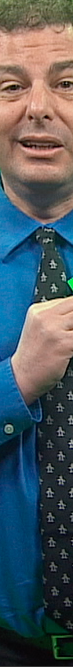

In [7]:
# foreground
tmp = arr[30:,547:620]
display(image.array_to_img(tmp,scale=False))

noList = np.reshape(tmp,(-1,3))

In [15]:
arr.shape

(697, 1215, 3)

In [0]:
# Build a list of pixels for both positive and negative examples.
alldat = np.concatenate((yesList,noList))
 
# labels
labs = np.concatenate((np.ones(len(yesList)), np.zeros(len(noList))))

In [0]:
# Add an additional column to the data corresponding to 
#  the offset parameter.
alldat = np.concatenate((alldat,np.ones((len(alldat),1))),1)

# Compute the loss of the rule specified by weights w with respect
#  to the data alldat labeled with labs
def loss(w, alldat, labs):
  # Compute a weighted sum for each instance
  h = np.matmul(alldat,w)
  # transform the sum using the sigmoid function
  y = 1/(1 + np.exp(-h))
  # take the difference between the labels and the output of the 
  #  sigmoid, squared, then sum up over all instances to get the 
  #  total loss.
  loss = np.sum((labs - y)**2)
  return(loss)

In [10]:
# repeat 10 times
for i in range(10):
  # pick a random vector of weights, with values between -1 and 1
  w = np.random.random(4)*2-1
  # report the loss
  print(w, loss(w, alldat, labs))

[0.65559579 0.77041616 0.11339312 0.95264278] 48681.30013309903
[-0.83437366 -0.40234323 -0.21863846  0.96001923] 250928.8443796845
[ 0.15744785 -0.93203647 -0.40949016  0.38628892] 250937.68134816835
[ 0.91277482  0.01360337 -0.22430754 -0.22278153] 282935.2432642344
[ 0.98822111 -0.52903792  0.37604697 -0.65608863] 296201.8961396032
[-0.11325854  0.23614296 -0.71273869 -0.70046099] 484.726369610219
[-0.67644643  0.17546387  0.88057329 -0.70008284] 43932.74928001063
[ 0.19484408  0.10994835  0.33489167 -0.35051408] 48608.30903886705
[ 0.37360004  0.13564264 -0.8020384  -0.64490881] 252710.71538503864
[-0.02685193  0.78809986  0.38073904  0.80307852] 48674.70704901765


In [11]:
w = [ 0.78595931,  0.17463049, -0.18481674, -0.43675441]
loss(w,alldat,labs)

36957.00573200492

In [29]:
w = [ 0.786,  0.175, -0.558, -0.437]; print(loss(w, alldat, labs))


29602.762802711197


In [0]:
ws = [i/100 for i in range(-200,200)]
# [ 0.78595931,  0.17463049, -0.18481674, -0.43675441]
# ls = [loss([ 0.78595931,  0.17463049, -0.18481674, w4], alldat, labs) for w4 in ws] # line
# ls = [loss([ 0.78595931,  0.17463049, w3, -0.43675441], alldat, labs) for w3 in ws] # wiggly z
# ls = [loss([ 0.78595931, w2, -0.18481674, -0.43675441], alldat, labs) for w2 in ws] # wiggly z
# ls = [loss([ w1, 0.17463049, -0.18481674, -0.43675441], alldat, labs) for w1 in ws] # backwards 2

In [0]:
ws = [i/100 for i in range(-150,100)]
# [ 0.78595931,  0.17463049, -0.18481674, -0.43675441]
# [ 0.786,  0.175, -0.558, -0.437]

ls = [loss([ 0.786,  0.175, -0.558, w4], alldat, labs) for w4 in ws] # smooth checkmark
# ls = [loss([ 0.786,  0.175, w3, -0.437], alldat, labs) for w3 in ws] # 2 + tail
# ls = [loss([ 0.786, w2, -0.558, -0.437], alldat, labs) for w2 in ws] # Z
# ls = [loss([ w1, 0.175, -0.558, -0.437], alldat, labs) for w1 in ws] # Z

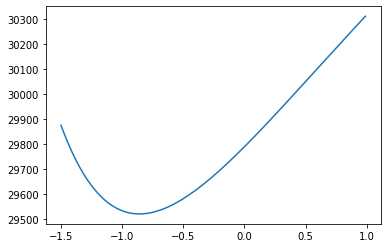

In [37]:
import matplotlib.pyplot as plt

plt.plot(ws,ls)

In [38]:
def fit(w,alldat,labs):
  # alpha represents how big of a step we’ll
  #  be taking in the direction of the derivative.
  #  It’s called the learning rate.
  alpha = 0.1

  # We'll stop searching when we're at a (near) local min
  done = False
  while not done:
    # Every 100 iterations or so, let’s
    #  take a peek at the weights, the learning
    #  rate, and the current loss
    if np.random.random() < 0.01: print(w, alpha, loss(w,alldat,labs))
    # The next few lines compute the gradient
    #  of the loss function. The details aren’t
    #  important right now.
    # delta_w is the change in the weights
    #  suggested by the gradient
    h = np.matmul(alldat,w)
    y = 1/(1 + np.exp(-h))
#    delta_w = np.add.reduce(np.reshape((labs-y) * np.exp(-h)/(1 + np.exp(-h))**2,(len(y),1)) * alldat)
    delta_w = np.add.reduce(np.reshape((labs-y) * np.exp(-h)*y**2,(len(y),1)) * alldat)
    # if we take a step of size alpha and update
    #  the weights, we’ll get new weights neww.
    current_loss = loss(w,alldat,labs)
    alpha *= 2
    neww = w + alpha* delta_w
    while loss(neww,alldat,labs) >= current_loss and not done:
      alpha /= 2
      if alpha*max(abs(delta_w)) < 0.0001: 
        done = True
        print(alpha,delta_w)
      else: neww = w + alpha* delta_w
    if not done: w = neww
  return(w)

# w = fit([-2.0, 0, 0.093, -0.713],alldat,labs)

w = [ 0.786,  0.175, -0.558, -0.437]
w = fit(w,alldat,labs)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in exp
  if __name__ == '__main__':


[ 0.63512906  0.21541948 -0.70889312 -0.44289221] 1.52587890625e-06 23008.507892688845
[-0.13205305  0.30433725 -0.90518501 -0.47678296] 4.8828125e-05 492.8709466015901
[-0.16767198  0.3027291  -0.88746381 -0.48929587] 4.8828125e-05 488.9137455436651
[-0.16852936  0.30002376 -0.88785421 -0.48966397] 2.44140625e-05 488.60329331029357
[-0.27381312  0.27648114 -0.80823841 -0.54355354] 4.8828125e-05 477.890283638611
[-0.31368624  0.26229636 -0.76774506 -0.56823627] 2.44140625e-05 473.2978370429763
[-0.44543314  0.20284903 -0.58761436 -0.66560424] 2.44140625e-05 455.2812800583372
[-0.45125363  0.20032824 -0.57798452 -0.67065993] 1.220703125e-05 454.3305248214106
[-0.45815596  0.19750627 -0.56639885 -0.67677471] 2.44140625e-05 453.30712359154575
[-0.49956431  0.17524945 -0.49778068 -0.71696202] 1.220703125e-05 447.15235377701384
[-0.50730803  0.17165124 -0.48497289 -0.72529892] 1.220703125e-05 446.05877040592384
[-0.52653449  0.16311669 -0.45397752 -0.74737386] 1.220703125e-05 443.5879866316

In [39]:
print(loss([-0.138, -1.62, -1.00, -1.00], alldat, labs))
print(loss(w, alldat, labs))


250920.1982577528
404.56160879116885


In [67]:
yesList[500,]

array([  0., 163.,  43.], dtype=float32)

In [40]:
w

array([-0.92246276,  0.11226589, -0.24727034, -2.04819454])

In [22]:
len(labs)-np.sum((np.matmul(alldat,w)>0 - labs)**2)

49000

In [41]:
for i in range(4):
  print(i,np.sum((2*(np.matmul(alldat,w)>0) + labs) == i))

0 48640
1 360
2 51
3 250560


In [28]:
w

array([-0.90688475,  0.11226061, -0.24708653, -2.0562321 ])

In [73]:
w-[-0.13848766 -7.62250645 -2.03242896 -8.17282845]

array([15.92154733, 18.0788015 , 17.71285429, 16.1688934 ])

In [57]:
labs[280000:280010]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

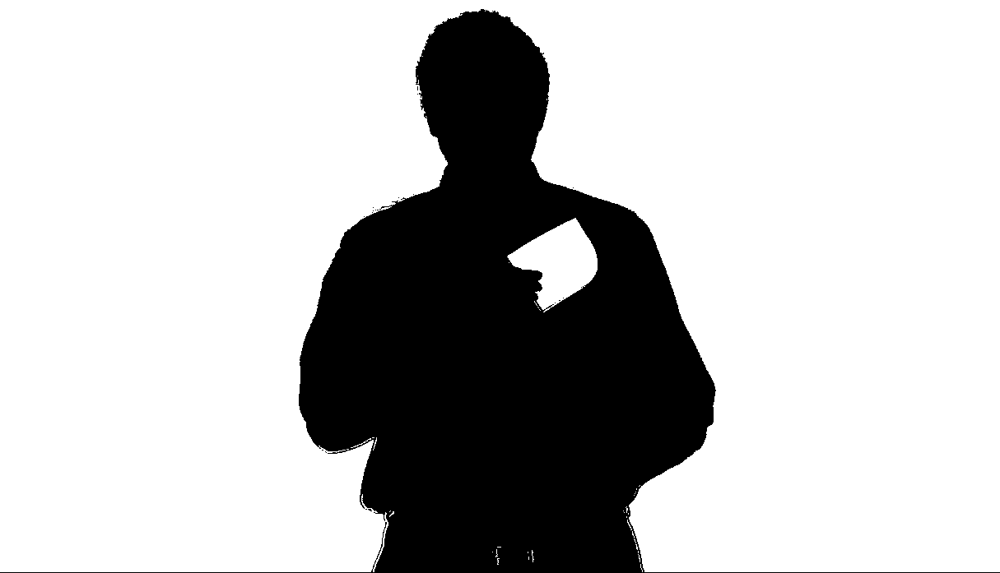

In [42]:
# Turn the pixels in the image into a list
flat = np.reshape(arr,(-1,3))
# Stick a "1" at the end of each color
flat = np.concatenate((flat,np.ones((len(flat),1))),1)
# Multiply by the pixels by the weight matrix,
#  and set a threshold of 0.
out = np.matmul(flat, w) > 0.0
# Reshape the output as a 2 dimensional list instead of 1 dimensional
out = np.reshape(out,(-1,1))
# Now, concatenate this list it itself three times to make something
#  like a color. Reshape the resulting list into the shape of the original
#  image.
newarr = np.reshape(np.concatenate((out, out, out),1),arr.shape)
# Display the image
display(image.array_to_img(newarr))

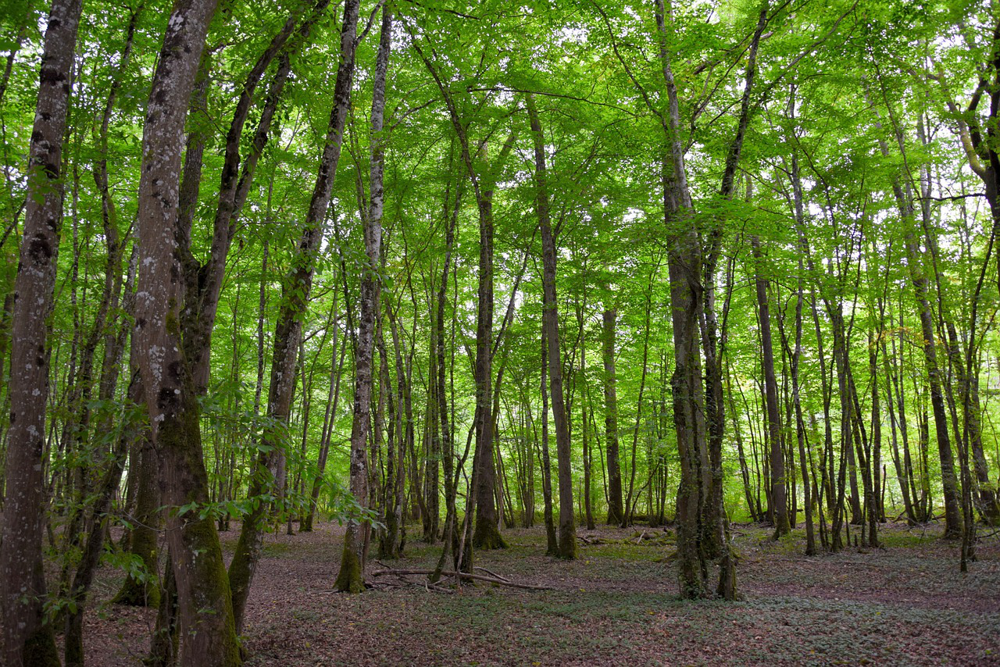

In [76]:
img = image.load_img("forest-1061965_1280.jpg")

display(img)

bkg = image.img_to_array(img)

(697, 1215, 3)


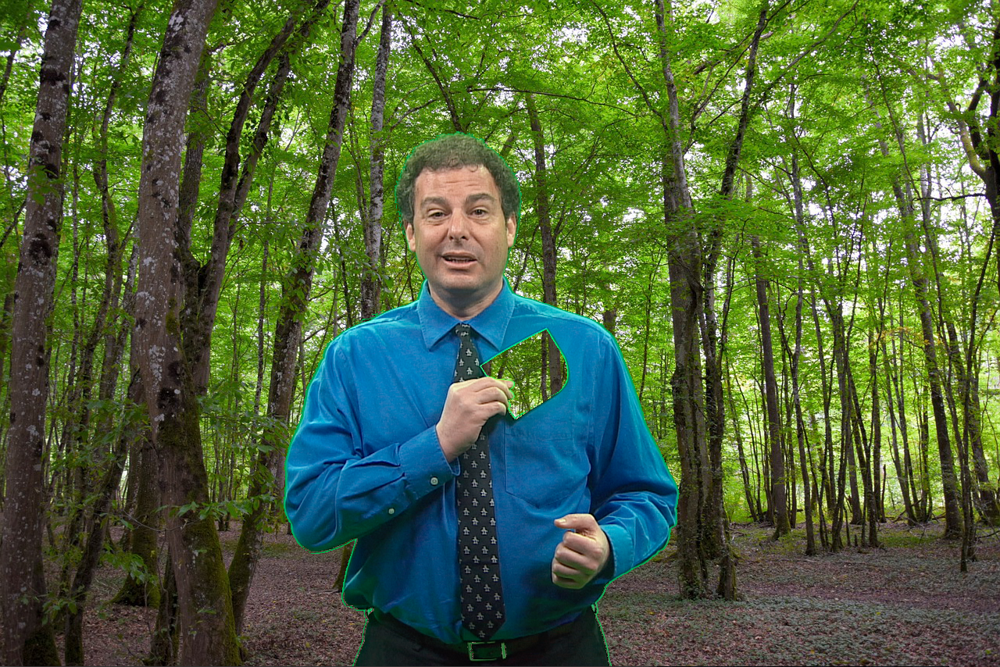

In [77]:
def composite(mask, foreground, background):
  ishift = 157
  print(mask.shape)
  for i in range(min(background.shape[0],foreground.shape[0]+ishift)):
    for j in range(min(background.shape[1], foreground.shape[1])):
      fgi = i - ishift
#      if not mask[i][j][0]: background[i][j] = foreground[i][j]
      if fgi >= 0 and not mask[fgi][j][0]: background[i][j] = foreground[fgi][j]
  display(image.array_to_img(background,scale=False))

composite(newarr,arr,bkg)

In [69]:
bkg.shape

(854, 1280, 3)

In [66]:
arr.shape

(697, 1215, 3)

In [70]:
854-697

157

In [0]:
# centroid of yes points
np.mean(yesList,axis=0)

array([  6.50711536, 156.17079517,  44.92268684,   1.        ])

In [0]:
yesList[1000]

array([  0., 156.,  42.,   1.])

In [0]:
np.mean(yesList,axis=0)

array([  6.50711536, 156.17079517,  44.92268684,   1.        ])

In [0]:
unique_list = []
for i in yesList:
 if i not in unique_list:
   unique_list.append(i)

ValueError: ignored

In [0]:
# Build a list of pixels for both positive and negative examples.
yesList = np.reshape(arr[:62,:],(-1,3))
noList = np.reshape(arr[88:148,133:148],(-1,3))
# add another features
yesList = np.concatenate((yesList,np.ones((len(yesList),1))),1)
noList = np.concatenate((noList,np.ones((len(noList),1))),1)
alldat = np.concatenate((yesList,noList))

# labels
labs = np.concatenate((np.ones(len(yesList)), np.zeros(len(noList))))

In [0]:
import random

oldloss = 1000000
loss = oldloss - 1
alpha = 0.0001

# while abs(oldloss-loss) > 0.000001:
for rep in range(10000):
  h = np.matmul(alldat,w)
  y = 1/(1 + np.exp(-h))
#  y = h
  oldloss = loss
  loss = np.sum((labs - y)**2)
  if rep % 1000 == 0: print(loss) # loss, w
#  delta_w = np.reshape(alpha*(labs-y),(len(y),1)) * alldat
  delta_w = np.reshape(alpha*(labs-y) * np.exp(-h)/(1 + np.exp(-h))**2,(len(y),1)) * alldat
  w += np.add.reduce(delta_w)

787.7020765069911
97.41796241570768
81.31994475798628
318.18905110561656
358.71153876708706
50.76069764160308
46.1416449686868
39.28139320762066
38.25370581033772
40.5260869255568


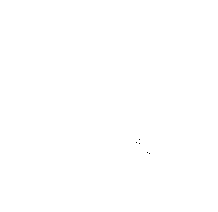

In [0]:
flat = np.reshape(arr,(-1,3))
flat = np.concatenate((flat,np.ones((len(flat),1))),1)
# out = reg.predict(np.array(flat)) > .5
out = np.matmul(flat, w) > 0.5
out = np.reshape(out,(-1,1))
newarr = np.reshape(np.concatenate((out, out, out),1),arr.shape)
newarr.shape
display(image.array_to_img(newarr))

In [0]:
w

array([-0.63201575,  0.49756008,  0.09758238, -7.11490801])

In [0]:
# c and d


In [0]:
def center_plot(centers,arr):
  flat = np.reshape(arr,(-1,3))
  res = np.reshape(flat,(1,len(flat),3))-np.reshape(centers,(len(centers),1,3))
  res2 = np.add.reduce(res**2,2)
  centerids = np.apply_along_axis(np.argmin,0,res2)
  newflat = centers[centerids]
  newarr = np.reshape(newflat,arr.shape)
  display(image.array_to_img(newarr,scale=False))

In [0]:
# k-means

def kmeans(arr, data, k):
  # grab the centers from random points
  centers = data[[random.randint(0,len(data)-1) for i in range(k)]]
  #  oldcenters = centers + 0
  oldloss = 0
  loss = 1
  done = False
  while oldloss != loss:
    center_plot(centers, arr)
#  for rep in range(20):
    ## assign each data point to a center
    # first, subtract the set of centers from each data point
    res = np.reshape(data,(1,len(data),3))-np.reshape(centers,(k,1,3))
    # then, square and sum each to get (squared) distances
    res2 = np.add.reduce(res**2,2)
    # then, pick the index of the center with the smallest distance 
    # for each datapoint
    oldloss = loss
    loss = sum(np.apply_along_axis(np.min,0,res2))
    print(loss)
    centerids = np.apply_along_axis(np.argmin,0,res2)

    # average the data points in each center to define the center
    centers = np.zeros(shape=(k,3))
    for i in range(k):
      cols = np.array([data[j] for j in range(len(data)) if centerids[j] == i])
      centers[i] = cols.mean(0)
    done = True
  return(centers)

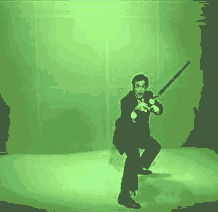

10739906.0


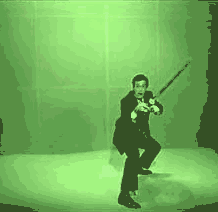

7912571.170913056


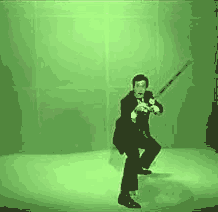

5831766.61726316


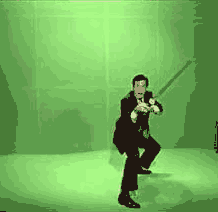

3285408.75384568


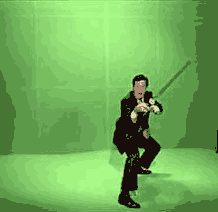

2734271.7977032205


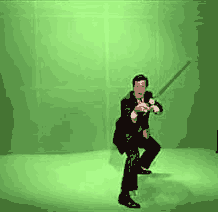

2533957.210947258


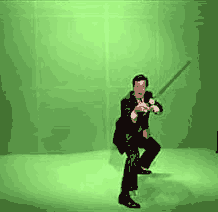

2479294.0923593547


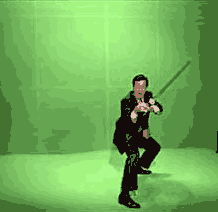

2450162.249065399


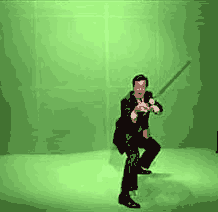

2424793.197770385


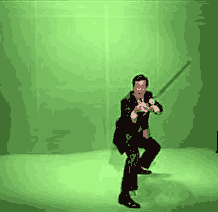

2411112.449367828


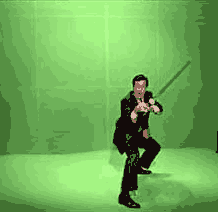

2399828.367694968


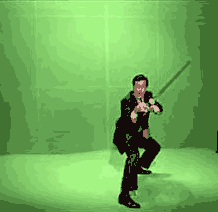

2386835.3268321194


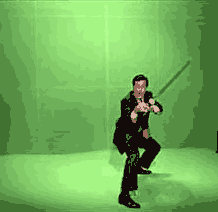

2372121.1509298


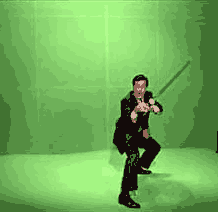

2361580.3607115704


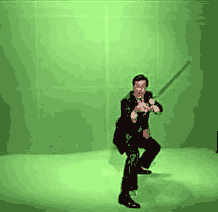

2353211.080893277


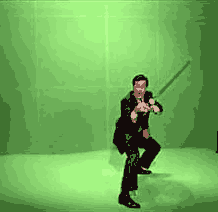

2345709.199614839


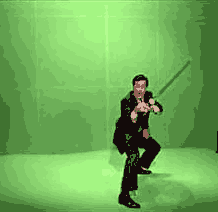

2340073.1617959347


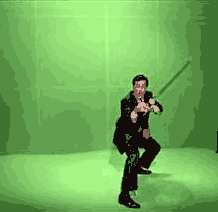

2333603.827719203


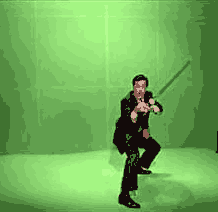

2323870.4325570688


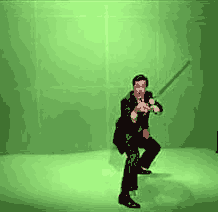

2316448.7852120087


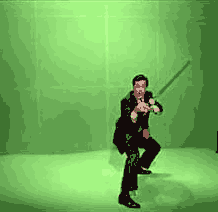

2311548.3408317696


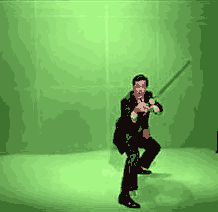

2305541.3845462245


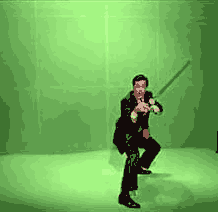

2296402.918436067


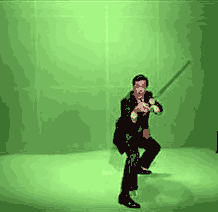

2274333.6433459274


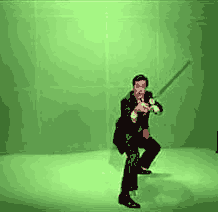

2222809.766142697


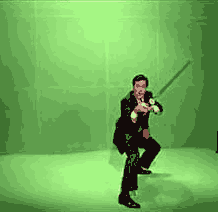

2120945.118549772


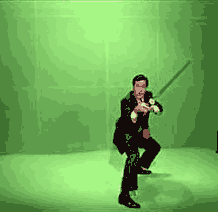

2061522.3151158981


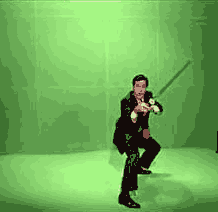

2038882.4554206843


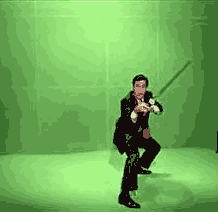

2022814.7551058922


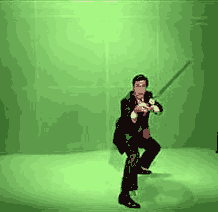

2001204.7228548115


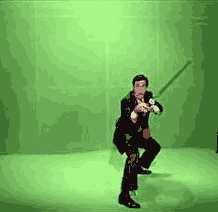

1973723.543703279


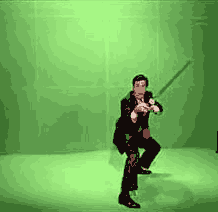

1919528.644937057


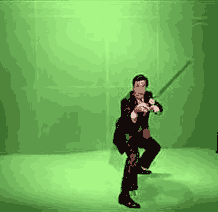

1913099.4421409816


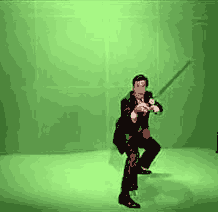

1909517.20289977


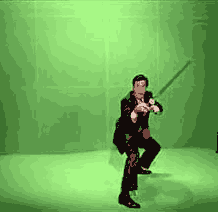

1905948.4511033143


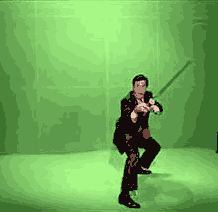

1902729.045326297


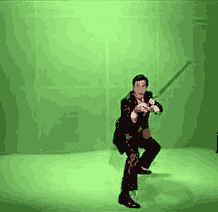

1900154.6403851917


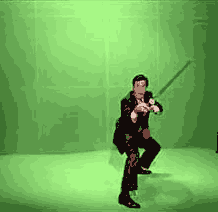

1896883.3872094126


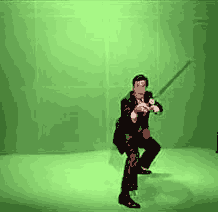

1894399.542859713


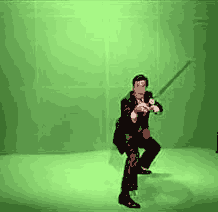

1892887.5025341003


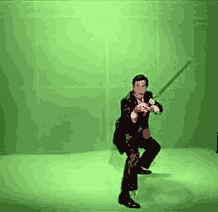

1890436.8321752278


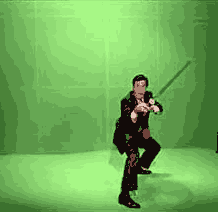

1887778.3903701608


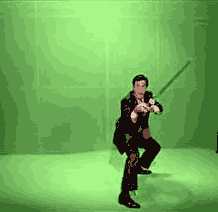

1886108.5019473848


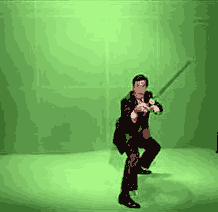

1884538.6463709893


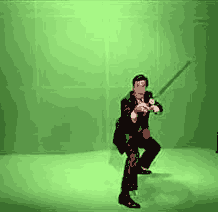

1883252.5024796976


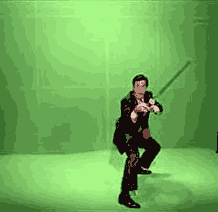

1882166.2809951196


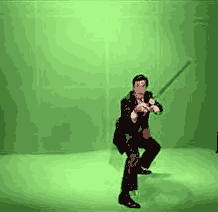

1881184.7049444236


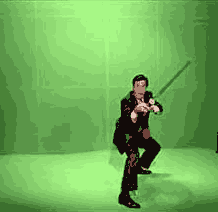

1879831.2827198706


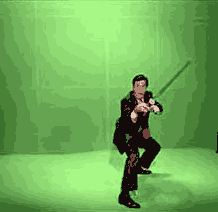

1878767.0338443513


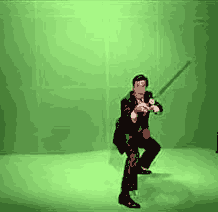

1877997.6465707936


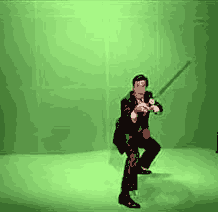

1877044.2348325455


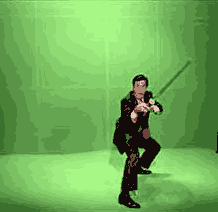

1876838.3163567109


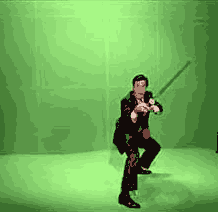

1876731.865687631


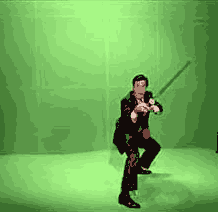

1876662.5845555624


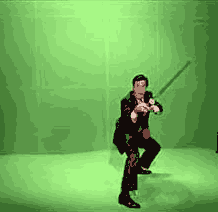

1876633.4614532094


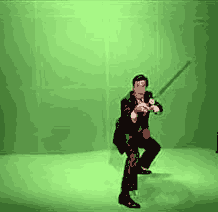

1876627.6968443128


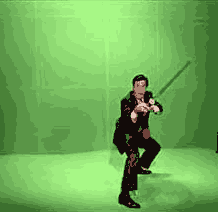

1876574.699194269


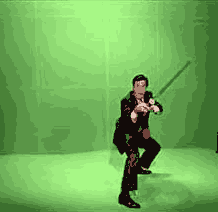

1876478.7165760754


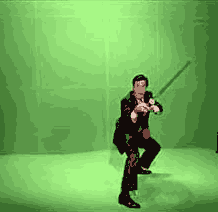

1876421.2377257657


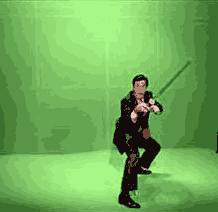

1876327.8702576926


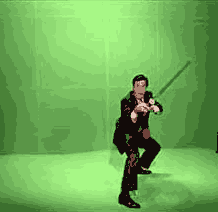

1876233.0350863852


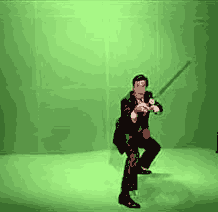

1875980.5971484233


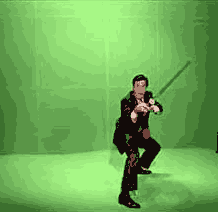

1875904.9466142622


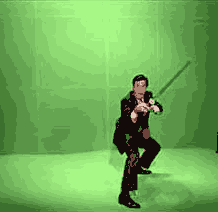

1875856.7419996783


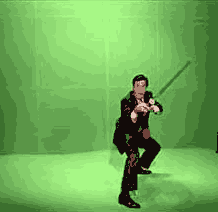

1875855.0433946801


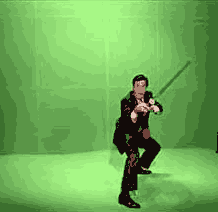

1875855.0433946801


array([[ 60.34708405, 112.41820526,  46.5177803 ],
       [167.33352661, 247.18586731, 134.03242493],
       [ 18.05893898,  11.12770176,   9.44007874],
       [ 90.27801514, 149.01374817,  71.71670532],
       [173.1073761 , 132.93289185, 114.24832153],
       [ 74.16571808, 130.60142517,  56.09000015],
       [230.8888855 , 201.01852417, 189.46296692],
       [133.34138489, 205.65861511, 107.36551666],
       [109.86746979,  66.1204834 ,  59.65060425],
       [152.18171692, 227.47079468, 121.98760986],
       [112.56177521, 179.1182251 ,  91.23555756],
       [101.06491089, 165.27116394,  81.82333374],
       [123.03198242, 192.41957092,  98.68109131],
       [159.80679321, 236.58605957, 128.47013855],
       [143.72288513, 218.10241699, 115.62583923]])

In [0]:
yesList = np.reshape(arr[:62,:],(-1,3))
noList = np.reshape(arr[88:148,133:148],(-1,3))
# add another features
data = np.concatenate((yesList,noList))

kmeans(arr,data,15)

In [0]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(alldat, labs)
print(reg.score(alldat, labs))
print(reg.coef_)
print(reg.intercept_)

# reg.predict(np.array([[3, 5]]))


0.7861116406045114
[-0.00718922  0.0095176  -0.00361007  0.        ]
0.3908329280328935


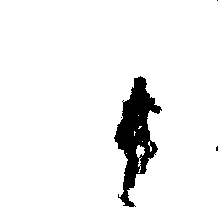

In [0]:
flat = np.reshape(arr,(-1,3))
flat = np.concatenate((flat,np.ones((len(flat),1))),1)
out = reg.predict(np.array(flat)) > .5
out = np.reshape(out,(-1,1))
newarr = np.reshape(np.concatenate((out, out, out),1),arr.shape)
newarr.shape
display(image.array_to_img(newarr))

In [0]:
out[1:10]

array([[0.65421516],
       [0.64780671],
       [0.63755319],
       [0.63114474],
       [0.62858135],
       [0.67746804],
       [0.66208775],
       [0.65183423],
       [0.67626211]])

In [0]:
alldat = np.array(((1,0,0,0),(0,1,0,0),(0,0,1,0),(0,0,0,1)))
labs = np.array((1,2,3,4))

oldloss = 1000000
loss = oldloss - 1
alpha = 0.001

w = np.random.random(4)
while abs(oldloss-loss) > 0.00001:
  h = np.matmul(alldat,w)
  y = h
  oldloss = loss
  loss = np.sum((labs - y)**2)
  print(w) # loss
  delta_w = np.reshape(alpha*(labs-y),(len(y),1)) * alldat
  w += np.add.reduce(delta_w)

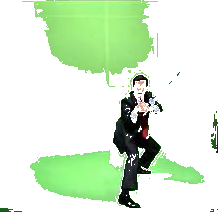

In [0]:
newarr = arr + 0
rows = len(newarr)
cols = len(newarr[0])

c = np.array([ 92, 145 ,  80])
# sum = 0
d = 150
for row in range(rows):
  for col in range(cols):
#    sum += newarr[row][col]
    if np.sum(np.sqrt((newarr[row][col]-c)**2)) <= d:
      newarr[row][col] = np.array([ 255, 255 , 255])

display(image.array_to_img(newarr,scale=False))



In [0]:
x = np.array(3)
x.shape

()

In [0]:
x_list = np.reshape(x,(1,))
x_list.shape

(1,)

In [0]:
p = np.array((56,28,0))
p.shape

(3,)

In [0]:
np.reshape(p,(20,20,3))

In [0]:
np.repeat(p,100)

array([56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56,
       56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56,
       56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56,
       56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56,
       56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56,
       56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,
       28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28, 28,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0

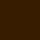

In [0]:
display(image.array_to_img(np.reshape(np.repeat(p,1600),(40,40,3),order="F"),scale=False))

In [0]:
np.reshape(np.repeat(p,2),(2,3),order='F')

array([[56, 28,  0],
       [56, 28,  0]])

In [0]:
arr.shape

(212, 218, 3)

In [0]:
newarr = arr[:,:10,:]

In [0]:
newarr.shape

(212, 10, 3)

In [0]:
display(image.array_to_img(newarr))